# Exponential Degradation Model

In [1]:
import pandas as pd
import numpy as np
#to plot the data
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
#import matplotlib as mpl
#mpl.rcParams.update(mpl.rcParamsDefault)
import time
import os
os.chdir("/Users/tomxu/Documents/NASA-Jet-Engine-Maintenance/Data/CMaps/")
from sklearn.preprocessing import MinMaxScaler #to normalize data
from sklearn.metrics import classification_report, confusion_matrix, roc_curve
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.utils import class_weight
from scipy import optimize

In [2]:
def prepare_data():
    dependent_var = ['RUL']
    index_columns_names =  ["UnitNumber","Cycle"]
    operational_settings_columns_names = ["OpSet"+str(i) for i in range(1,4)]
    sensor_measure_columns_names =["SensorMeasure"+str(i) for i in range(1,22)]
    input_file_column_names = index_columns_names + operational_settings_columns_names + sensor_measure_columns_names
    df_train = pd.read_csv('train_FD001.txt',delim_whitespace=True,names=input_file_column_names)
    rul = pd.DataFrame(df_train.groupby('UnitNumber')['Cycle'].max()).reset_index()
    rul.columns = ['UnitNumber', 'max']
    df_train = df_train.merge(rul, on=['UnitNumber'], how='left')
    df_train['RUL'] = df_train['max'] - df_train['Cycle']
    df_train.drop('max', axis=1, inplace=True)
    df_test = pd.read_csv('test_FD001.txt', delim_whitespace=True, names=input_file_column_names)
    y_true = pd.read_csv('RUL_FD001.txt', delim_whitespace=True,names=["RUL"])
    y_true["UnitNumber"] = y_true.index + 1    
    return df_train, df_test, y_true

In [3]:
df_train, df_test, y_true = prepare_data()
df_train.shape, df_test.shape, y_true.shape

((20631, 27), (13096, 26), (100, 2))

In [4]:
feats = df_train.columns.drop(['UnitNumber', 'Cycle', 'RUL'])

In [5]:
sc = MinMaxScaler(feature_range=(-1,1))
df_train[feats] = sc.fit_transform(df_train[feats])
df_test[feats] = sc.transform(df_test[feats])

In [6]:
df_train.head()

,UnitNumber,Cycle,OpSet1,OpSet2,OpSet3,SensorMeasure1,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure5,...,SensorMeasure13,SensorMeasure14,SensorMeasure15,SensorMeasure16,SensorMeasure17,SensorMeasure18,SensorMeasure19,SensorMeasure20,SensorMeasure21,RUL
0,1,1,-0.080460,-0.666667,-1.0,-1.0,-0.632530,-0.186396,-0.380486,-1.0,...,-0.588235,-0.600784,-0.272028,-1.0,-0.333333,-1.0,-1.0,0.426357,0.449323,191
1,1,2,0.218391,-0.500000,-1.0,-1.0,-0.433735,-0.093961,-0.294733,-1.0,...,-0.441176,-0.674373,-0.177376,-1.0,-0.333333,-1.0,-1.0,0.333333,0.462027,190
2,1,3,-0.494253,0.500000,-1.0,-1.0,-0.313253,-0.260955,-0.258947,-1.0,...,-0.558824,-0.656414,-0.285110,-1.0,-0.666667,-1.0,-1.0,0.255814,0.242751,189
3,1,4,0.080460,0.000000,-1.0,-1.0,-0.313253,-0.487683,-0.337610,-1.0,...,-0.411765,-0.650222,-0.666795,-1.0,-0.333333,-1.0,-1.0,0.147287,0.324772,188
4,1,5,-0.218391,-0.333333,-1.0,-1.0,-0.301205,-0.485066,-0.190749,-1.0,...,-0.529412,-0.650532,-0.195845,-1.0,-0.166667,-1.0,-1.0,0.178295,0.409003,187


In [7]:
df_test.head()

,UnitNumber,Cycle,OpSet1,OpSet2,OpSet3,SensorMeasure1,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure5,...,SensorMeasure12,SensorMeasure13,SensorMeasure14,SensorMeasure15,SensorMeasure16,SensorMeasure17,SensorMeasure18,SensorMeasure19,SensorMeasure20,SensorMeasure21
0,1,1,0.264368,0.500000,-1.0,-1.0,0.090361,-0.378679,-0.461175,-1.0,...,0.292111,-0.558824,-0.735680,-0.382070,-1.0,-0.333333,-1.0,-1.0,0.116279,0.323667
1,1,2,-0.310345,-0.500000,-1.0,-1.0,-0.698795,-0.240898,-0.555368,-1.0,...,0.479744,-0.470588,-0.590463,-0.573682,-1.0,-0.166667,-1.0,-1.0,0.364341,0.373654
2,1,3,0.034483,0.166667,-1.0,-1.0,-0.246988,-0.306736,-0.355503,-1.0,...,0.398721,-0.558824,-0.688719,-0.082724,-1.0,-0.166667,-1.0,-1.0,0.457364,0.442695
3,1,4,0.482759,0.000000,-1.0,-1.0,-0.259036,-0.429693,-0.183997,-1.0,...,0.147122,-0.500000,-0.659820,-0.485956,-1.0,-0.500000,-1.0,-1.0,0.333333,0.324220
4,1,5,0.160920,0.000000,-1.0,-1.0,-0.216867,-0.295836,-0.335922,-1.0,...,0.475480,-0.558824,-0.694499,-0.398230,-1.0,-0.666667,-1.0,-1.0,0.317829,0.432753


### Taking rolling averages to reduce noise

In [9]:
window = 5

In [10]:
df_train_mean = df_train.groupby('UnitNumber')[feats].rolling(window = window).mean()
df_train_mean = df_train_mean.reset_index()
df_train_mean.dropna(inplace = True)
df_train_mean.drop(['level_1'], axis = 1, inplace = True)
df_train_mean.head()

,UnitNumber,OpSet1,OpSet2,OpSet3,SensorMeasure1,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure5,SensorMeasure6,...,SensorMeasure12,SensorMeasure13,SensorMeasure14,SensorMeasure15,SensorMeasure16,SensorMeasure17,SensorMeasure18,SensorMeasure19,SensorMeasure20,SensorMeasure21
4,1,-0.098851,-0.200000,-1.0,-1.0,-0.398795,-0.302812,-0.292505,-1.0,1.0,...,0.531770,-0.505882,-0.646465,-0.319431,-1.0,-0.366667,-1.0,-1.0,0.268217,0.377575
5,1,-0.181609,-0.100000,-1.0,-1.0,-0.365060,-0.348419,-0.307562,-1.0,1.0,...,0.533475,-0.500000,-0.658375,-0.332820,-1.0,-0.400000,-1.0,-1.0,0.243411,0.348799
6,1,-0.202299,0.033333,-1.0,-1.0,-0.325301,-0.344059,-0.343822,-1.0,1.0,...,0.536887,-0.523529,-0.656662,-0.385764,-1.0,-0.400000,-1.0,-1.0,0.274419,0.323281
7,1,-0.181609,0.033333,-1.0,-1.0,-0.300000,-0.387922,-0.365631,-1.0,1.0,...,0.541151,-0.523529,-0.661121,-0.401462,-1.0,-0.366667,-1.0,-1.0,0.280620,0.304722
8,1,-0.179310,0.066667,-1.0,-1.0,-0.327711,-0.316503,-0.413369,-1.0,1.0,...,0.449893,-0.541176,-0.677923,-0.394382,-1.0,-0.366667,-1.0,-1.0,0.333333,0.322784


In [11]:
df_train_mean.shape

(20231, 25)

### Selecting features using monotonicity

\begin{equation*}
Monotonicity (x) = \frac{1}{m}\sum_{j=1}^m \frac{|\text{number of positive diff} (x_j) - \text{number of negative diff} (x_j)|}{n-1}
\end{equation*}

where n is the length of data and m is the number of units. diff(x_j) is the lag difference of specific feature. 

In [12]:
df_lag = df_train_mean.groupby('UnitNumber').diff(1)
df_lag['UnitNumber'] = df_train_mean['UnitNumber']
df_lag.dropna(inplace = True)
df_lag = df_lag.reset_index(drop = True)
df_lag.head()

,OpSet1,OpSet2,OpSet3,SensorMeasure1,SensorMeasure2,SensorMeasure3,SensorMeasure4,SensorMeasure5,SensorMeasure6,SensorMeasure7,...,SensorMeasure13,SensorMeasure14,SensorMeasure15,SensorMeasure16,SensorMeasure17,SensorMeasure18,SensorMeasure19,SensorMeasure20,SensorMeasure21,UnitNumber
0,-0.082759,0.100000,0.0,0.0,0.033735,-0.045607,-0.015057,0.0,0.0,0.019968,...,0.005882,-0.011910,-0.013390,0.0,-0.033333,0.0,0.0,-0.024806,-0.028777,1
1,-0.020690,0.133333,0.0,0.0,0.039759,0.004360,-0.036259,0.0,0.0,0.038003,...,-0.023529,0.001713,-0.052943,0.0,0.000000,0.0,0.0,0.031008,-0.025518,1
2,0.020690,0.000000,0.0,0.0,0.025301,-0.043863,-0.021810,0.0,0.0,-0.026409,...,0.000000,-0.004459,-0.015698,0.0,0.033333,0.0,0.0,0.006202,-0.018558,1
3,0.002299,0.033333,0.0,0.0,-0.027711,0.071419,-0.047738,0.0,0.0,-0.048953,...,-0.017647,-0.016803,0.007080,0.0,0.000000,0.0,0.0,0.052713,0.018061,1
4,-0.032184,0.100000,0.0,0.0,-0.079518,0.073163,-0.038893,0.0,0.0,-0.026409,...,0.011765,-0.009124,-0.001231,0.0,0.000000,0.0,0.0,0.015504,0.035902,1


In [13]:
def monotonicity(data):    
    num_pos = data[data > 0].shape[0]
    num_neg = data[data < 0].shape[0]
    tot_n = data.shape[0] - 1    
    mon_val = np.abs(num_pos - num_neg)/tot_n
    return mon_val

In [25]:
list_val = []
for col in feats:
    mon_val = []
    for unit in df_lag.UnitNumber.unique():
        mon_val.append(monotonicity(df_lag.loc[df_lag.UnitNumber == unit, col]))
    list_val.append({'feature': col, 'monotonicity_val': np.mean(mon_val)})   
mon_df = pd.DataFrame(list_val)
mon_df

,feature,monotonicity_val
0,OpSet1,0.034497
1,OpSet2,0.030402
2,OpSet3,0.000000
3,SensorMeasure1,0.000000
4,SensorMeasure2,0.065320
5,SensorMeasure3,0.051756
6,SensorMeasure4,0.092576
7,SensorMeasure5,0.000000
8,SensorMeasure6,0.001210
9,SensorMeasure7,0.078061


In [26]:
mon_df = mon_df.sort_values(by = 'monotonicity_val', ascending = False)
mon_df.head()

,feature,monotonicity_val
16,SensorMeasure14,0.157243
11,SensorMeasure9,0.147807
13,SensorMeasure11,0.116696
14,SensorMeasure12,0.105777
6,SensorMeasure4,0.092576


<AxesSubplot:xlabel='monotonicity_val', ylabel='feature'>

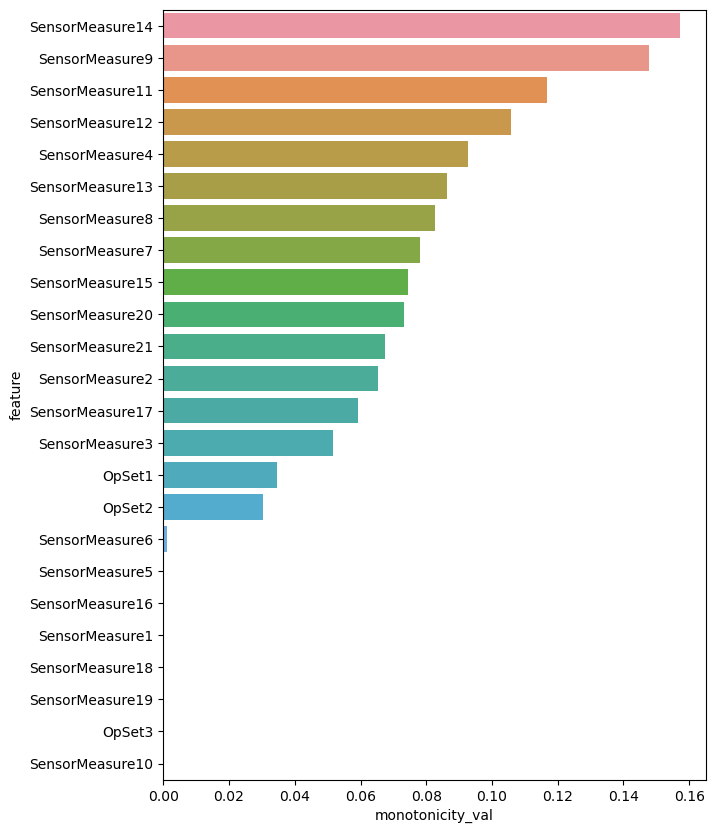

In [27]:
fig, ax = plt.subplots(figsize = (7,10))
sns.barplot(y = mon_df.feature, x = mon_df.monotonicity_val)

Features with monotonicity value larger than 0.08 are selected.

In [28]:
feats = mon_df.feature[mon_df.monotonicity_val > 0.08]
feats

16    SensorMeasure14
11     SensorMeasure9
13    SensorMeasure11
14    SensorMeasure12
6      SensorMeasure4
15    SensorMeasure13
10     SensorMeasure8
Name: feature, dtype: object

In [29]:
len(feats)

7

### PCA to fuse features

In [31]:
from sklearn.decomposition import PCA

In [32]:
pca = PCA(n_components=3)
pca_data = pca.fit_transform(df_train_mean[feats])
pca_df = pd.DataFrame(pca_data, columns = ['pc1', 'pc2', 'pc3'])
pca_df['UnitNumber'] = df_train_mean.UnitNumber.values
pca_df['cycle'] = pca_df.groupby('UnitNumber').cumcount()+1
pca_df['RUL'] = pca_df.groupby('UnitNumber').cycle.transform('max') - pca_df.cycle
pca_df.head()

,pc1,pc2,pc3,UnitNumber,cycle,RUL
0,-0.496369,-0.132625,-0.122027,1,1,187
1,-0.549425,-0.137713,-0.118303,1,2,186
2,-0.594405,-0.115734,-0.093867,1,3,185
3,-0.628940,-0.124971,-0.079502,1,4,184
4,-0.603982,-0.132597,0.020663,1,5,183


### Visualizing principal components

In [33]:
pcs = ['pc1', 'pc2', 'pc3']

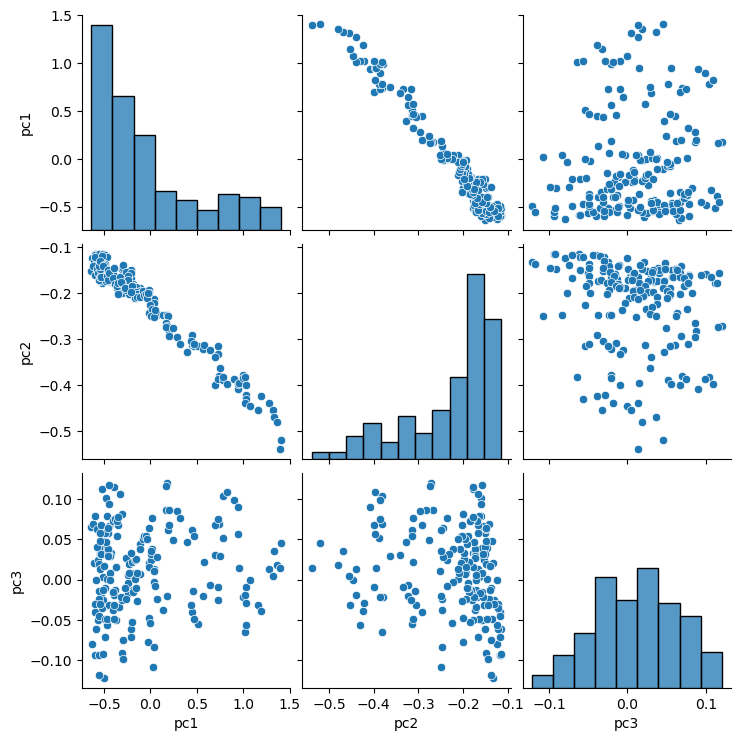

In [34]:
sns.pairplot(data = pca_df[pca_df.UnitNumber == 1], x_vars= pcs, y_vars = pcs)

#### Choosing PC1 and PC2 and plotting

<AxesSubplot:xlabel='pc1', ylabel='pc2'>

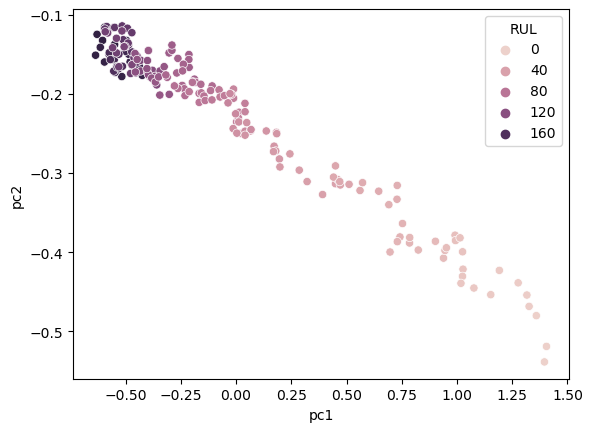

In [35]:
sns.scatterplot(data = pca_df[pca_df.UnitNumber == 1], x = "pc1", y = "pc2", hue = "RUL")

#### Considering PC1 as a health indicator and visualizing against cycle

Text(0, 0.5, 'Health Indicator')

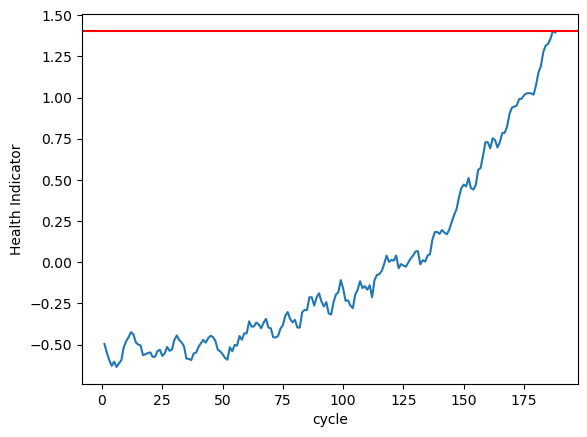

In [36]:
fig, ax = plt.subplots()
sns.lineplot(data = pca_df[pca_df.UnitNumber == 1], x = "cycle", y = "pc1", ax = ax)
plt.axhline(pca_df[pca_df.UnitNumber == 1].pc1.max(), color = 'r')
ax.set_ylabel("Health Indicator")

#### visualizing health indicators of all units

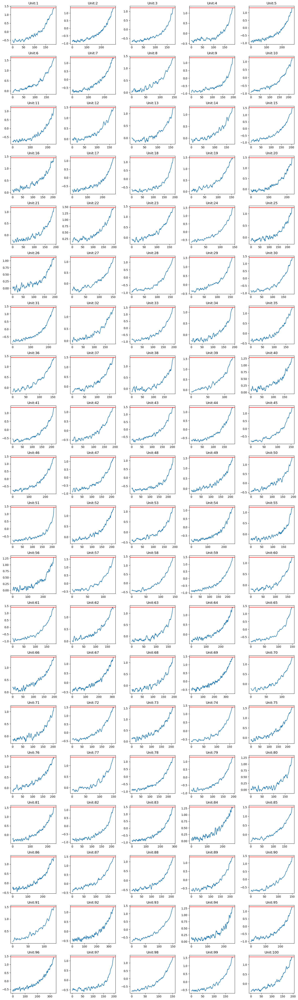

In [56]:
fig, ax = plt.subplots(nrows = 20, ncols = 5, figsize = (15,50))
ax = ax.ravel()
for i in range(0,100):
    sns.lineplot(data = pca_df[pca_df.UnitNumber == i+1], x = "cycle", y = "pc1", ax = ax[i])
    ax[i].axhline(pca_df[pca_df.UnitNumber == i+1].pc1.max(), color = 'r')
    ax[i].set_title("Unit:" + str(i+1))
    ax[i].set_xlabel("")
    ax[i].set_ylabel("")
plt.tight_layout()

### Visualizing Health Indicator values at different RULs

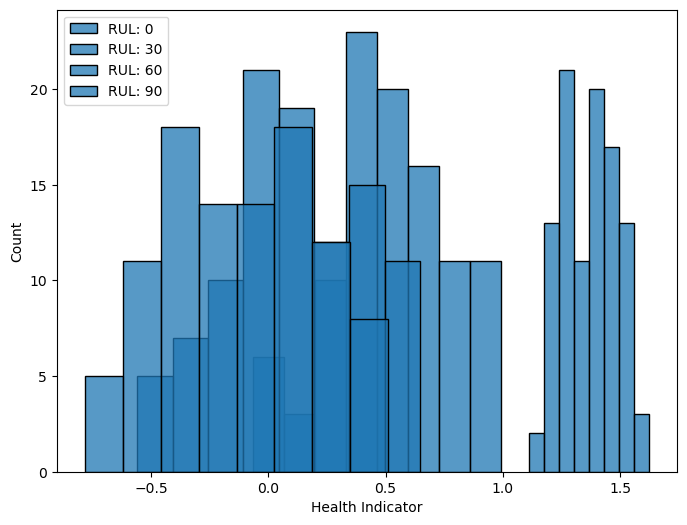

In [40]:
fig, ax = plt.subplots(figsize = (8,6))
sns.histplot(pca_df.pc1[pca_df.RUL == 0], label= "RUL: 0")
sns.histplot(pca_df.pc1[pca_df.RUL == 30], label= "RUL: 30")
sns.histplot(pca_df.pc1[pca_df.RUL == 60], label= "RUL: 60")
sns.histplot(pca_df.pc1[pca_df.RUL == 90], label= "RUL: 90")
plt.xlabel("Health Indicator")
plt.legend()
plt.show()

As we see the spread decreases with the decrease in RUL.

### Failure Threshold

Taking a mean Health Indicator value at RUL=0 as a Failure threshold

In [41]:
threshold = pca_df.pc1[pca_df.RUL == 0].mean()
threshold

1.3662479253124789

In [42]:
threshold_std = pca_df.pc1[pca_df.RUL == 0].std()
threshold_std

0.11653709561659327

<AxesSubplot:xlabel='pc1', ylabel='Count'>

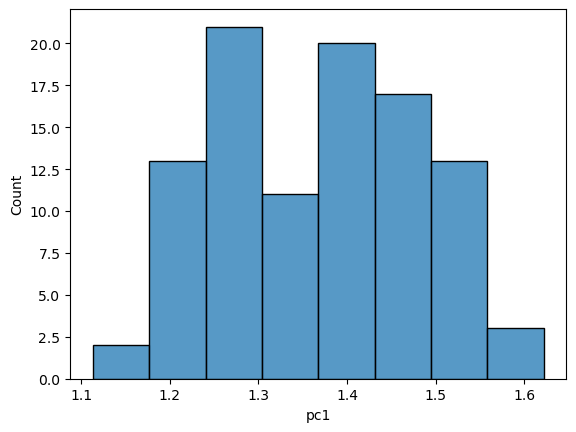

In [59]:
sns.histplot(pca_df.pc1[pca_df.RUL == 0])

### Exponential Degradation

Exponential degradation model can be defined as below

\begin{equation*}
h(t) = \phi + \theta \ exp ( \beta t )
\end{equation*}

- where $h(t)$ is the health indicator as a function of time. 
- $\phi$ is the intercept term considered as a constant. 
- $\theta$ and $\beta$  are random parameters determining the slope of the model, where $\theta$ is lognormal-distributed and $\beta$ is Gaussian-distributed.

Fitting the exponential degradation curve for all units in train data

In [45]:
def exp_degradation(parameters, cycle):
    '''
    Calculate an exponetial degradation of the form:
    ht = phi + theta * exp(beta * cycle)
    ''' 
    phi = parameters[0]
    theta = parameters[1]
    beta = parameters[2]    
    ht = phi + theta * np.exp(beta * cycle)
    return ht

In [46]:
def residuals(parameters, data, y_observed, func):
    '''
    Compute residuals of y_predicted - y_observed
    where:
    y_predicted = func(parameters,x_data)
    '''
    return func(parameters, data) - y_observed

Initial values for parameters

In [47]:
param_0 = [-1, 0.01, 0.01]

In [50]:
exp_params_list = []
for i in range(1,101):    
    ht = pca_df.pc1[pca_df.UnitNumber == i]
    cycle = pca_df.cycle[pca_df.UnitNumber == i]
    OptimizeResult = optimize.least_squares(residuals, param_0, args=(cycle, ht, exp_degradation))
    phi, theta, beta = OptimizeResult.x    
    exp_params_list.append({'UnitNumber':i, 'phi': phi, 'theta': theta, 'beta': beta})
exp_params_df = pd.DataFrame(exp_params_list, columns = ['UnitNumber', 'phi', 'theta', 'beta'])

In [51]:
exp_params_df.head()

,UnitNumber,phi,theta,beta
0,1,-0.635627,0.065714,0.018378
1,2,-0.917313,0.046571,0.013751
2,3,-0.644046,0.014137,0.027443
3,4,-0.336294,0.004275,0.031951
4,5,-0.914597,0.046348,0.014524


#### Visualizing fitted exponential curve

Text(0, 0.5, 'Health Indicator')

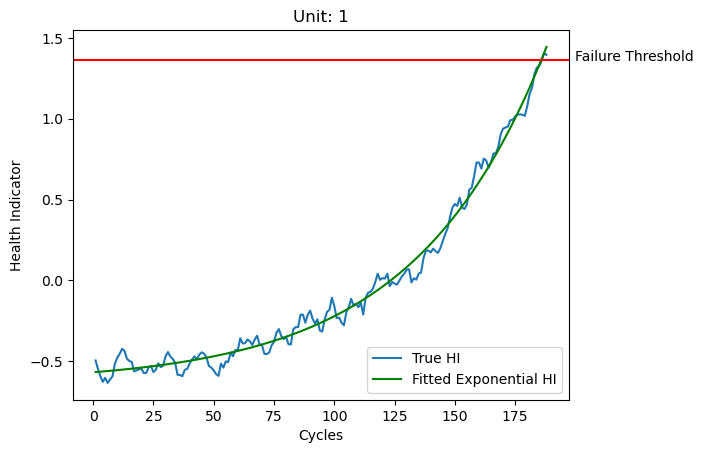

In [52]:
phi = exp_params_df.phi[exp_params_df.UnitNumber == 1].values
theta = exp_params_df.theta[exp_params_df.UnitNumber == 1].values
beta = exp_params_df.beta[exp_params_df.UnitNumber == 1].values
cycles = pca_df.cycle[pca_df.UnitNumber == 1]
pred_ht = exp_degradation([phi, theta, beta], cycles)
fig, ax = plt.subplots()
sns.lineplot(data = pca_df[pca_df.UnitNumber == 1], x = "cycle", y = "pc1", ax = ax, label = "True HI")
sns.lineplot(y = pred_ht, x = cycles, ax = ax, color = "green", label = "Fitted Exponential HI")
ax.axhline(threshold, color = 'r')
ax.text(200,threshold - 0.01,'Failure Threshold',rotation=0)
ax.set_title("Unit: 1")
ax.set_xlabel("Cycles")
ax.set_ylabel("Health Indicator")

For all Units

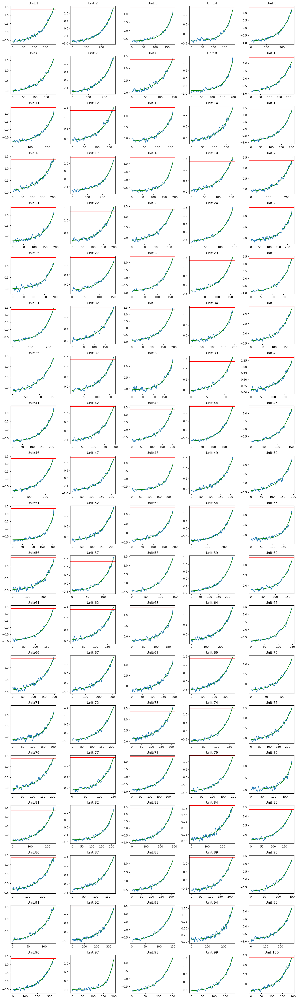

In [55]:
fig, ax = plt.subplots(nrows = 20, ncols = 5, figsize = (15,50))
ax = ax.ravel()
for i in range(0,100):    
    phi = exp_params_df.phi[exp_params_df.UnitNumber == i+1].values
    theta = exp_params_df.theta[exp_params_df.UnitNumber == i+1].values
    beta = exp_params_df.beta[exp_params_df.UnitNumber == i+1].values    
    cycles = pca_df.cycle[pca_df.UnitNumber == i+1]
    pred_ht = exp_degradation([phi, theta, beta], cycles)    
    sns.lineplot(data = pca_df[pca_df.UnitNumber == i+1], x = "cycle", y = "pc1", ax = ax[i])
    sns.lineplot(y = pred_ht, x = cycles, ax = ax[i], color = "green")
    ax[i].axhline(threshold, color = 'r')
    ax[i].set_title("Unit:" + str(i+1))
    ax[i].set_xlabel("")
    ax[i].set_ylabel("")
plt.tight_layout()

The exponential curves result in good fit. Since, The last value of health indicator is different in all units, we do not see threhsold in plots.

#### Visualizing various parameters distributions

<AxesSubplot:xlabel='beta', ylabel='Count'>

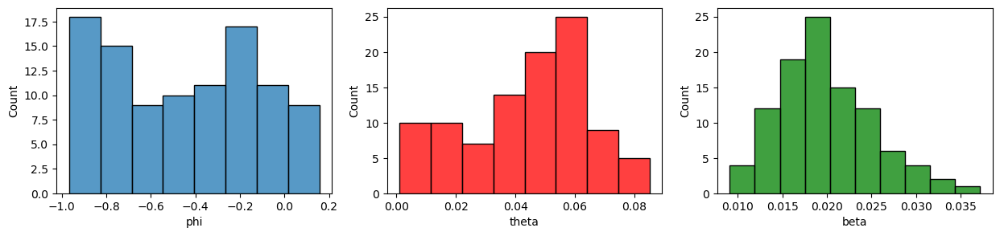

In [58]:
fig, ax = plt.subplots(figsize = (15,3), nrows = 1, ncols = 3)
sns.histplot(exp_params_df.phi, ax = ax[0])
sns.histplot(exp_params_df.theta, ax = ax[1], color = "red")
sns.histplot(exp_params_df.beta, ax = ax[2], color = "green")

### Preparaing Test data

In [60]:
window = 5
df_test_mean = df_test.groupby('UnitNumber')[feats].rolling(window = window).mean()
df_test_mean = df_test_mean.reset_index()
df_test_mean.dropna(inplace = True)
df_test_mean.drop(['level_1'], axis = 1, inplace = True)
df_test_mean.head()

,UnitNumber,SensorMeasure14,SensorMeasure9,SensorMeasure11,SensorMeasure12,SensorMeasure4,SensorMeasure13,SensorMeasure8
4,1,-0.673836,-0.743803,-0.395238,0.358635,-0.378393,-0.529412,-0.612121
5,1,-0.669894,-0.742385,-0.380952,0.375693,-0.399190,-0.500000,-0.636364
6,1,-0.679492,-0.747824,-0.426190,0.362900,-0.335584,-0.500000,-0.612121
7,1,-0.688100,-0.755183,-0.495238,0.373134,-0.338623,-0.482353,-0.612121
8,1,-0.685520,-0.749331,-0.473810,0.428571,-0.299055,-0.482353,-0.593939


In [61]:
pca_test_data = pca.transform(df_test_mean[feats])
pca_test_df = pd.DataFrame(pca_test_data, columns = ['pc1', 'pc2', 'pc3'])
pca_test_df['UnitNumber'] = df_test_mean.UnitNumber.values
pca_test_df['cycle'] = pca_test_df.groupby('UnitNumber').cumcount()+1
pca_test_df.head()

,pc1,pc2,pc3,UnitNumber,cycle
0,-0.480441,-0.124101,0.064602,1,1
1,-0.489994,-0.122203,0.071390,1,2
2,-0.469134,-0.134640,0.025408,1,3
3,-0.507406,-0.152732,0.013009,1,4
4,-0.498859,-0.145213,-0.051034,1,5


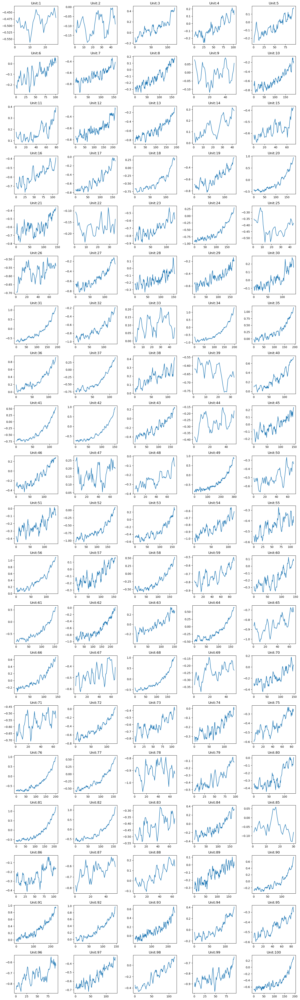

In [62]:
fig, ax = plt.subplots(nrows = 20, ncols = 5, figsize = (15,50))
ax = ax.ravel()
for i in range(0,100):    
    sns.lineplot(data = pca_test_df[pca_test_df.UnitNumber == i+1], x = "cycle", y = "pc1", ax = ax[i])
    ax[i].set_title("Unit:" + str(i+1))
    ax[i].set_xlabel("")
    ax[i].set_ylabel("")
plt.tight_layout()

### Predicting RUL

Steps

1. Fit an exponential model on test data using parameters as mean values and bounds as 25th and 75th percentile values of exponential models found using training data
2. Calculate total cycles to reach failure threshold
3. Find remaining useful life
4. Repeat 1-3 for all test units

In [63]:
phi_vals = exp_params_df.phi
theta_vals = exp_params_df.theta
beta_vals = exp_params_df.beta

In [64]:
phi_vals.mean()

-0.45116624540146155

In [65]:
param_1 = [phi_vals.mean(), theta_vals.mean(), beta_vals.mean()]
param_1

[-0.45116624540146155, 0.04428276178065643, 0.02003310731256208]

In [66]:
lb = 25
ub = 75
phi_bounds = [np.percentile(phi_vals, lb), np.percentile(phi_vals, ub)] 
theta_bounds = [np.percentile(theta_vals, lb), np.percentile(theta_vals, ub)] 
beta_bounds = [np.percentile(beta_vals, lb), np.percentile(beta_vals, ub)] 

In [67]:
bounds = ([phi_bounds[0], theta_bounds[0], beta_bounds[0]], 
          [phi_bounds[1], theta_bounds[1], beta_bounds[1]])
bounds

([-0.7767914432997509, 0.030713551475146275, 0.01632868279222508],
 [-0.1491447611944145, 0.05975043522239631, 0.023015292160641788])

In [68]:
result_test_list = []
for i in pca_test_df.UnitNumber.unique():    
    ht = pca_test_df.pc1[pca_test_df.UnitNumber == i]
    cycle = pca_test_df.cycle[pca_test_df.UnitNumber == i]    
    OptimizeResult = optimize.least_squares(residuals, param_1, bounds=bounds,
                                            args = (cycle, ht, exp_degradation))
    phi, theta, beta = OptimizeResult.x
    total_cycles = np.log((threshold - phi) / theta) / beta
    RUL = total_cycles - cycle.max()
    result_test_list.append({'UnitNumber':i, 'phi': phi, 'theta': theta, 'beta': beta,
                             'Pred_RUL': RUL, 'True_RUL': y_true.RUL[y_true.UnitNumber == i].values[0]})
result_test_df = pd.DataFrame(result_test_list, columns = ['UnitNumber', 'phi', 'theta', 'beta', 'Pred_RUL', 'True_RUL'])

In [69]:
result_test_df.head()

,UnitNumber,phi,theta,beta,Pred_RUL,True_RUL
0,1,-0.560818,0.053971,0.023015,128.345284,112
1,2,-0.152439,0.032075,0.023015,122.606940,98
2,3,-0.149145,0.059750,0.018523,52.553348,69
3,4,-0.232891,0.059750,0.019077,70.306308,82
4,5,-0.220934,0.059750,0.019306,75.867237,91


### Results

Text(0, 0.5, 'True RUL')

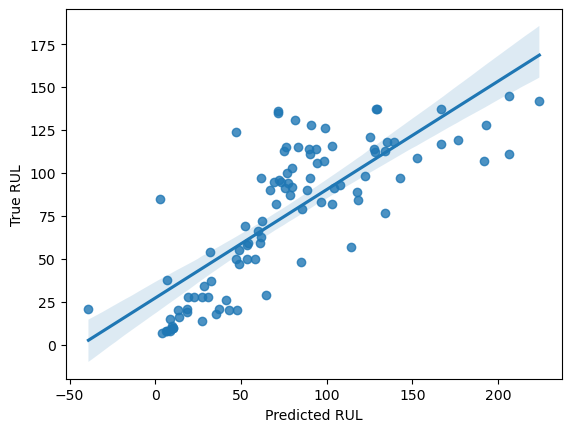

In [70]:
sns.regplot(x = result_test_df.Pred_RUL, y = result_test_df.True_RUL)
plt.xlabel('Predicted RUL')
plt.ylabel('True RUL')

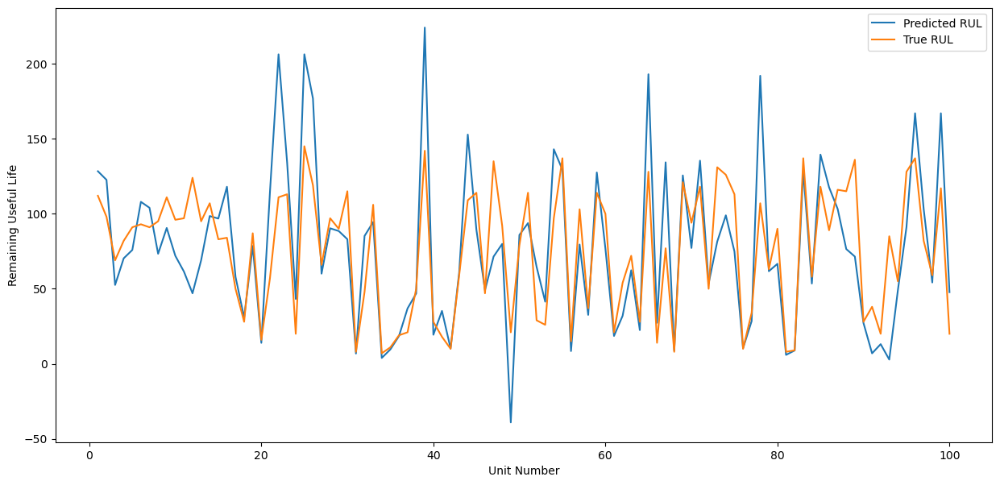

In [71]:
fig, ax = plt.subplots(figsize = (15, 7))
sns.lineplot(x = result_test_df.UnitNumber, y = result_test_df.Pred_RUL, label = "Predicted RUL")
sns.lineplot(x = result_test_df.UnitNumber, y = result_test_df.True_RUL, label = "True RUL")
plt.xlabel("Unit Number")
plt.ylabel("Remaining Useful Life")
plt.legend(loc = 1)

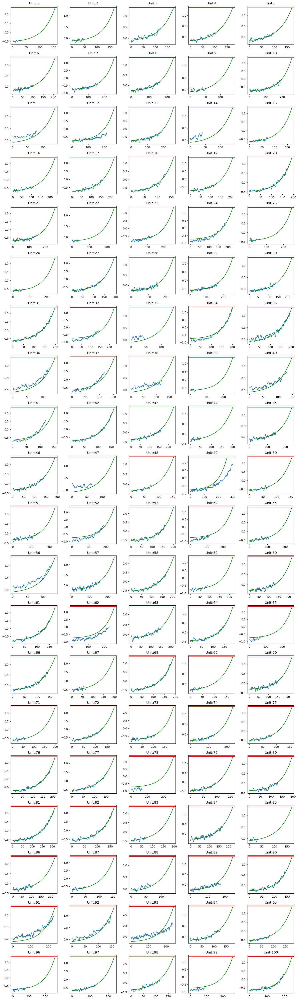

In [72]:
fig, ax = plt.subplots(nrows = 20, ncols = 5, figsize = (15,50))
ax = ax.ravel()
for i in range(0,100):    
    phi = result_test_df.phi[result_test_df.UnitNumber == i+1].values[0]
    theta = result_test_df.theta[result_test_df.UnitNumber == i+1].values[0]
    beta = result_test_df.beta[result_test_df.UnitNumber == i+1].values[0]
    Pred_RUL = result_test_df.Pred_RUL[result_test_df.UnitNumber == i+1].values[0]    
    cycles = pca_test_df.cycle[pca_test_df.UnitNumber == i+1]
    total_cycles = [j for j in range(1, int(cycles.max() + Pred_RUL + 1))]
    pred_ht = exp_degradation([phi, theta, beta], pd.Series(total_cycles))    
    sns.lineplot(data = pca_test_df[pca_test_df.UnitNumber == i+1], x = "cycle", y = "pc1", ax = ax[i])
    sns.lineplot(y = pred_ht, x = total_cycles, ax = ax[i], color = "green")
    ax[i].axhline(threshold, color = 'r')
    ax[i].set_title("Unit:" + str(i+1))
    ax[i].set_xlabel("")
    ax[i].set_ylabel("")
plt.tight_layout()

### Errors

In [73]:
mean_squared_error(result_test_df.True_RUL, result_test_df.Pred_RUL)

1013.688990811067

In [74]:
mean_absolute_error(result_test_df.True_RUL, result_test_df.Pred_RUL)

22.76249502620981

In [75]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [76]:
mean_absolute_percentage_error(result_test_df.True_RUL, result_test_df.Pred_RUL)

33.655654359116575